In [135]:
import pandas as pd
import numpy as np
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
from collections import Counter
import plotly.express as px
import os
id900_path='C:\\Users\\QKD\\Documents\\ID900-2121014T010\\'
d_path='D:\\ID900\\'

In [136]:
def Trap_counter(c1_counter,c2_counter):
    """_summary_: 整合为字典

    Args:
        c1_counter (array): [time,counter]
        c2_counter (array): [time,counter]

    Returns:
        dict: {'c1_time': c1_counter[0], 'c1': c1_counter[1], 
               'c2_time': c2_counter[0], 'c2': c2_counter[1]}
    """
    return dict(c1_time=c1_counter[0],c1=c1_counter[1],
                c2_time=c2_counter[0],c2=c2_counter[1])

def timeStamp2continus(time_stamp_with_start,ref_period=100e-3):
    """_summary_: 将start触发的时间戳转换为连续时间

    Args:
        file_nmae (array): 时间戳
        ref_period (float, optional): 参考光周期，单位毫秒. Defaults to 100e-3 ms.
    """
    time_offset=np.sign(np.diff(time_stamp_with_start))
    time_offset[time_offset>0]=0
    time_offset[time_offset<0]=1
    time_offset=np.r_[0,time_offset]
    time_offset*=int(100e-3*1e9) #ref period 100us in timestamp ps unit
    time_offset=np.cumsum(time_offset)
    time_stamp=time_stamp_with_start+time_offset
    return time_stamp


def Time_stampe2counter(time_stamp,time_interval=0.05):
    """_summary_: 将时间戳转换为计数器

    Args:
        time_stamp (array): 时间戳_description_
        time_interval (float, optional): 积分时间单位毫秒. Defaults to 0.05ms

    Returns:
        out: [time(ms),
              count]
    """
    time_interval*=1e9 #unit ms->ps
    data=time_stamp
    data=data/time_interval
    c=Counter(data.astype(int))
    ## sort with time 
    array_count=np.array(list(c.items())).T
    time0=np.sort(array_count[0])
    count0=np.take_along_axis(array_count[1],np.argsort(array_count[0]),axis=0)
    out= np.array([time0*time_interval*1e-9,count0])
    return out

def read_binary_timestamps(file_name):
    """_summary_: 读取二进制时间戳[ps]"""
    timestamps = np.fromfile(file_name, dtype=np.uint64)
    return timestamps.astype(np.int64)

def read_text_timestamps(file_name):
    """_summary_: 读时间戳[ps]"""
    timestamps = pd.read_csv(file_name,header=None)[0].values
    return timestamps

def Continus_out(time0,counter,time_len):
    out=np.zeros_like(time0,dtype=int)
    index_array=counter[0]/time_len
    out[index_array.astype(int)]=counter[1]
    return out

def Trap_dataframe(trap_dict,time0,time_len):
    c1=Continus_out(time0,[trap_dict['c1_time'],trap_dict['c1']],time_len)
    c2=Continus_out(time0,[trap_dict['c2_time'],trap_dict['c2']],time_len)
    return pd.DataFrame({'c1':c1,'c2':c2},index=time0)

def estimate_time_info(c1_peaks,c2_peaks,pluse_width,duty_cycle,time):
    """估计时间信息

    Args:
        c1_peaks (_type_): _description_
        c2_peaks (_type_): _description_
        pluse_width (_type_): 脉冲宽度 ms
        duty_cycle (_type_): 占空比 1 

    Returns:
        dict(pluse_period=estimate_pluse_period,
                c1_open_window=c1_estimate_open_window,
                c2_open_window=c2_estimate_open_window,
                error_window=error_open_windows)
    """
    estimate_pluse_period=(np.mean(np.diff(time[c1_peaks]))+np.mean(np.diff(time[c2_peaks])))/2
    c1_estimate_open_window,error_open_windows=(len(c1_peaks)-1)*pluse_width/duty_cycle,pluse_width/duty_cycle*(1-duty_cycle)/2
    c1_estimate_open_window-=error_open_windows
    c2_estimate_open_window,error_open_windows=(len(c2_peaks)-1)*pluse_width/duty_cycle,pluse_width/duty_cycle*(1-duty_cycle)/2
    c2_estimate_open_window-=error_open_windows
    return dict(pluse_period=estimate_pluse_period,
                c1_open_window=c1_estimate_open_window,
                c2_open_window=c2_estimate_open_window,
                error_window=error_open_windows)


In [137]:
start_time_len=1e-6 ##unit ms 1ns积分长度
ref_period=100e-3 #unit ms 100us 工作周期
open_window=40e-3 #ms 开窗时间 40us
pluse_width=3.2e-6 #ms 脉冲宽度 3.2ns
duty_cycle=0.2 #占空比

time0=np.arange(0,int(ref_period/start_time_len),1,dtype=int)
alice_c1_ts=read_binary_timestamps(d_path+'393_alice_awg_C3.bin')
alice_c2_ts=read_binary_timestamps(d_path+'393_alice_awg_C4.bin')
alice_c1_counter=Time_stampe2counter(alice_c1_ts,start_time_len)
alice_c2_counter=Time_stampe2counter(alice_c2_ts,start_time_len)
alice_dict=Trap_counter(alice_c1_counter,alice_c2_counter)

bob_c1_ts=read_binary_timestamps(d_path+'393_bob_awg_C3.bin')
bob_c2_ts=read_binary_timestamps(d_path+'393_bob_awg_C4.bin')
bob_c1_counter=Time_stampe2counter(bob_c1_ts,start_time_len)
bob_c2_counter=Time_stampe2counter(bob_c2_ts,start_time_len)
bob_dict=Trap_counter(bob_c1_counter,bob_c2_counter)

----alice time info----
pluse width, theory:16.00ns, estimate:31.77ns
number pluse, theory:2500.00, c1:1970, c2:2501
c1 open window, theory:40.00us, estimate:31.50±0.01us
c2 open window, theory:40.00us, estimate:39.99±0.01us

----bob time info----
pluse width, theory:16.00ns, estimate:28.04ns
number pluse, theory:2500.00, c1:2493, c2:2501
c1 open window, theory:40.00us, estimate:39.87±0.01us
c2 open window, theory:40.00us, estimate:39.99±0.01us



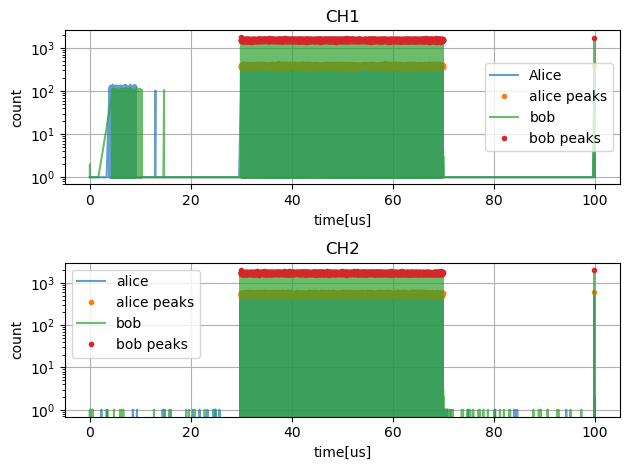

In [138]:
time0=np.arange(0,int(ref_period/start_time_len),1,dtype=int) # 以 start_time_len 为单位的时间戳
time=time0*start_time_len
alice_df=Trap_dataframe(alice_dict,time0,start_time_len)
alice_c1_peaks,_=find_peaks(alice_df['c1'],height=alice_df['c1'].max()/3,distance=pluse_width/start_time_len*5,prominence=10)
bob_df=Trap_dataframe(bob_dict,time0,start_time_len)
bob_c1_peaks,_=find_peaks(bob_df['c1'],height=bob_df['c1'].max()/3,distance=pluse_width/start_time_len*5,prominence=10)
plt.subplot(2,1,1)
plt.plot(alice_dict['c1_time']*1e3,alice_dict['c1'],label='Alice',alpha=0.7)
plt.plot(time[alice_c1_peaks]*1e3,alice_df['c1'][alice_c1_peaks],'.',label='alice peaks')
plt.plot(bob_dict['c1_time']*1e3,bob_dict['c1'],label='bob',alpha=0.7)
plt.plot(time[bob_c1_peaks]*1e3,bob_df['c1'][bob_c1_peaks],'.',label='bob peaks')
plt.ylabel('count')
plt.title('CH1')
plt.legend()
plt.yscale('log')
plt.xlabel('time[us]')
plt.grid()
plt.subplot(2,1,2)
alice_c2_peaks,_=find_peaks(alice_df['c2'],height=alice_df['c2'].max()/2,distance=3.3,prominence=10)
bob_c2_peaks,_=find_peaks(bob_df['c2'],height=bob_df['c2'].max()/2,distance=3.3,prominence=10)
plt.plot(time*1e3,alice_df['c2'],label='alice',alpha=0.7)
plt.plot(time[alice_c2_peaks]*1e3,alice_df['c2'][alice_c2_peaks],'.',label='alice peaks')
plt.plot(time*1e3,bob_df['c2'],label='bob',alpha=0.7)
plt.plot(time[bob_c2_peaks]*1e3,bob_df['c2'][bob_c2_peaks],'.',label='bob peaks')
plt.title('CH2')
plt.ylabel('count')
plt.legend()
plt.yscale('log')
plt.xlabel('time[us]')
plt.grid()
plt.tight_layout()
print('----alice time info----')
alice_time_dict=estimate_time_info(alice_c1_peaks,alice_c2_peaks,pluse_width,duty_cycle,time)
time_info='pluse width, theory:{:.2f}ns, estimate:{:.2f}ns\n'.format(pluse_width/duty_cycle*1e6,alice_time_dict['pluse_period']*1e6)
time_info+='number pluse, theory:{:.2f}, c1:{:.0f}, c2:{:.0f}\n'.format(open_window/pluse_width*duty_cycle,len(alice_c1_peaks),len(alice_c2_peaks))
time_info+='c1 open window, theory:{:.2f}us, estimate:{:.2f}±{:.2f}us\n'.format(open_window*1e3,alice_time_dict['c1_open_window']*1e3,alice_time_dict['error_window']*1e3)
time_info+='c2 open window, theory:{:.2f}us, estimate:{:.2f}±{:.2f}us\n'.format(open_window*1e3,alice_time_dict['c2_open_window']*1e3,alice_time_dict['error_window']*1e3)
print(time_info)

print('----bob time info----')
bob_time_dict=estimate_time_info(bob_c1_peaks,bob_c2_peaks,pluse_width,duty_cycle,time)
time_info='pluse width, theory:{:.2f}ns, estimate:{:.2f}ns\n'.format(pluse_width/duty_cycle*1e6,bob_time_dict['pluse_period']*1e6)
time_info+='number pluse, theory:{:.2f}, c1:{:.0f}, c2:{:.0f}\n'.format(open_window/pluse_width*duty_cycle,len(bob_c1_peaks),len(bob_c2_peaks))
time_info+='c1 open window, theory:{:.2f}us, estimate:{:.2f}±{:.2f}us\n'.format(open_window*1e3,bob_time_dict['c1_open_window']*1e3,bob_time_dict['error_window']*1e3)
time_info+='c2 open window, theory:{:.2f}us, estimate:{:.2f}±{:.2f}us\n'.format(open_window*1e3,bob_time_dict['c2_open_window']*1e3,bob_time_dict['error_window']*1e3)
print(time_info)
plt.show()

In [139]:
## 2x2的四宫格图
import plotly.graph_objects as go
from plotly.subplots import make_subplots

width_=260*1e-6 # 260ns in ms unit
ch1_time_head=time[alice_c1_peaks][1]
ch1_index_head=(alice_dict['c1_time']>=ch1_time_head-width_)&(alice_dict['c1_time']<ch1_time_head+width_)
ch1_time_tail=time[alice_c1_peaks][-2]
ch1_index_tail=(alice_dict['c1_time']>=ch1_time_tail-width_)&(alice_dict['c1_time']<ch1_time_tail+width_)
ch2_time_head=time[alice_c2_peaks][1]
ch2_index_head=(alice_dict['c2_time']>=ch2_time_head-width_)&(alice_dict['c2_time']<ch2_time_head+width_)
ch2_time_tail=time[alice_c2_peaks][-2]
ch2_index_tail=(alice_dict['c2_time']>=ch2_time_tail-width_)&(alice_dict['c2_time']<ch2_time_tail+width_)

fig=make_subplots(rows=2,cols=2,subplot_titles=('CH1 HEAD','CH1 TAIL','CH2 HEAD','CH2 TAIL'))
fig.add_trace(go.Scatter(x=alice_dict['c1_time']*1e3,y=alice_dict['c1'],name='Alice'),row=1,col=1)
fig.add_trace(go.Scatter(x=bob_dict['c1_time']*1e3,y=bob_dict['c1'],name='Bob'),row=1,col=1)
fig.update_xaxes(title_text='time[us]',range=[ch1_time_head*1e3-width_*1e3,ch1_time_head*1e3+width_*1e3],row=1,col=1)
fig.add_trace(go.Scatter(x=alice_dict['c1_time']*1e3,y=alice_dict['c1'],name='Alice'),row=1,col=2)
fig.add_trace(go.Scatter(x=bob_dict['c1_time']*1e3,y=bob_dict['c1'],name='Bob'),row=1,col=2)
fig.update_xaxes(title_text='time[us]',range=[ch1_time_tail*1e3-width_*1e3,ch1_time_tail*1e3+width_*1e3],row=1,col=2)
fig.add_trace(go.Scatter(x=alice_dict['c2_time']*1e3,y=alice_dict['c2'],name='Alice'),row=2,col=1)
fig.add_trace(go.Scatter(x=bob_dict['c2_time']*1e3,y=bob_dict['c2'],name='Bob'),row=2,col=1)
fig.update_xaxes(title_text='time[us]',range=[ch2_time_head*1e3-width_*1e3,ch2_time_head*1e3+width_*1e3],row=2,col=1)
fig.add_trace(go.Scatter(x=alice_dict['c2_time']*1e3,y=alice_dict['c2'],name='Alice'),row=2,col=2)
fig.add_trace(go.Scatter(x=bob_dict['c2_time']*1e3,y=bob_dict['c2'],name='Bob'),row=2,col=2)
fig.update_xaxes(title_text='time[us]',range=[ch2_time_tail*1e3-width_*1e3,ch2_time_tail*1e3+width_*1e3],row=2,col=2)
fig.update_layout(title_text='CH1&CH2 open window | time unit [us]',showlegend=False)
fig.show()



In [140]:
fig=px.line(x=alice_dict['c1_time']*1e3,y=alice_dict['c1'],labels={'x':'time[us]','y':'count log','name':'Alice'},log_y=True,title='CH1 Alice&Bob@1ns')
fig.add_scatter(x=bob_dict['c1_time']*1e3,y=bob_dict['c1'],name='bob')